# Libraries

In [7]:
# === Standard Libraries ===
import os
import re
import gzip
import gc
import argparse
from functools import partial
from itertools import product

# ===  Data ===
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad

# === Plotting ===
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import matplotlib.image as mpimg
from matplotlib.colorbar import Colorbar
import matplotlib.lines as mlines
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
import matplotlib.gridspec as gridspec
from skimage.filters import threshold_otsu
from skimage import measure, morphology
from matplotlib.colors import LinearSegmentedColormap


# === Image Processing ===
from PIL import Image
Image.MAX_IMAGE_PIXELS = None
from skimage.filters import threshold_otsu
from skimage import measure, morphology

import skimage
import skimage.io
import skimage.color
import skimage.exposure
from skimage.color import rgb2gray
from skimage.transform import rescale

# === Other ===
import svgwrite
import pkg_resources
import matplotlib as mpl



/scratch/local/jobs/35192068/ipykernel_247912/391273407.py:48: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


# Paths

In [ ]:
import os

# Raw data and images

raw_data_dir = "/project/nchevrier/projects/clevenger1/Projects/ArraySeq/Repurposing_data/GEO_data/individual_files"

# MOBs (F2)
MOB1_dir = os.path.join(raw_data_dir, "MOB_1")
MOB3_dir = os.path.join(raw_data_dir, "MOB_3")

# Kidneys (F3)
KI1_dir = os.path.join(raw_data_dir, "AS_KI_1")
KI2_dir = os.path.join(raw_data_dir, "AS_KI_2")
KI3_dir = os.path.join(raw_data_dir, "AS_KI_3")
KI4_dir = os.path.join(raw_data_dir, "AS_KI_4")

# images
HE_dir = "/project/nchevrier/projects/clevenger1/Projects/ArraySeq/Repurposing_data/GEO_data/images/to_share"



In [1]:
import os
import shutil


# Organize data to share

raw_data_dir = "/project/nchevrier/projects/clevenger1/Projects/ArraySeq/Repurposing_data/GEO_data/individual_files"
dest_dir = "/project/nchevrier/projects/clevenger1/Projects/ArraySeq/Repurposing_data/GEO_data/Files_Share/h5ad"

# subdirectories
subdirs = [
    os.path.join(raw_data_dir, "MOB_1"),
    os.path.join(raw_data_dir, "MOB_3"),
    os.path.join(raw_data_dir, "AS_KI_1"),
    os.path.join(raw_data_dir, "AS_KI_2"),
    os.path.join(raw_data_dir, "AS_KI_3"),
    os.path.join(raw_data_dir, "AS_KI_4"),
]


os.makedirs(dest_dir, exist_ok=True)

# Copy files
for subdir in subdirs:
    for file_name in os.listdir(subdir):
        print(file_name)
        src_path = os.path.join(subdir, file_name)
        dst_path = os.path.join(dest_dir, file_name)
        if os.path.isfile(src_path):
            shutil.copy2(src_path, dst_path)  


GSM8243006_MOB_1_raw_annotated.h5ad
GSM8243006_MOB_1.png
GSM8243006_MOB_3.png
GSM8243006_MOB_3_raw_annotated.h5ad
GSM8243007_AS_KI_1_annotated.h5ad
GSM8243007_AS_KI_1.png
GSM8243008_AS_KI_2.png
GSM8243008_AS_KI_2_annotated.h5ad
GSM8243009_AS_KI_3_annotated.h5ad
GSM8243009_AS_KI_3.png
GSM8243010_AS_KI_4.png
GSM8243010_AS_KI_4_annotated.h5ad


# Functions

In [4]:
import os, glob
import numpy as np
import skimage.io, skimage.color, skimage.exposure
from skimage import img_as_float32

# Load greyscale image
def _resolve_image_path(image_dir, sample, exts=(".png", ".tif", ".tiff", ".jpg", ".jpeg")):

    for ext in exts:
        p = os.path.join(image_dir, f"{sample}{ext}")
        if os.path.exists(p):
            return p
    hits = []
    for ext in exts:
        hits.extend(glob.glob(os.path.join(image_dir, f"{sample}*{ext}")))
    return hits[0] if hits else None

def load_grayscale_images(samples, image_dir, percentiles=(0, 55)):
    images = {}
    for sample in samples:
        path = _resolve_image_path(image_dir, sample)
        if path is None:
            raise FileNotFoundError(f"No image found for sample '{sample}' in {image_dir}")
        img = skimage.io.imread(path)

        # Handle grayscale, RGB, RGBA
        if img.ndim == 2:
            gray = img
        elif img.ndim == 3:
            if img.shape[2] == 4:
                img = skimage.color.rgba2rgb(img)
            gray = skimage.color.rgb2gray(img)
        else:
            raise ValueError(f"Unexpected image shape {img.shape} for '{sample}'")

        gray = img_as_float32(gray)

        if percentiles is not None:
            low, high = np.percentile(gray, percentiles)
            if not np.isfinite(low) or not np.isfinite(high) or high <= low:
                low, high = np.min(gray), np.max(gray)
            gray = skimage.exposure.rescale_intensity(gray, in_range=(low, high))

        images[sample] = gray
    return images



def distinct_palette(labels, s=0.9, v=0.9):

    labels = sorted(list(labels))
    n = len(labels)
    hues = np.linspace(0, 1, n, endpoint=False)
    colors = [mpl.colors.hsv_to_rgb((h, s, v)) for h in hues]
    return {lab: colors[i] for i, lab in enumerate(labels)}

# Plot a cell type column over greyscale H&E
def plot_celltype_on_HE(
    adata,
    cell_filter,
    celltype_col,
    output_path,
    image_dir,
    point_size=1,
    title="",
    legend_title=None,
    fixed_palette=None,
    sample_col="Sample_ID",
    x_col="x_scaled_image",
    y_col="y_scaled_image",
    title_fs=7, axis_label_fs=6, tick_fs=6,
    legend_fs=6, legend_title_fs=6, legend_markersize=4
):
    # Subset
    if cell_filter is None or (isinstance(cell_filter, str) and cell_filter.strip() == ""):
        subset = adata.copy()
    elif isinstance(cell_filter, (pd.Series, np.ndarray)):
        subset = adata[cell_filter].copy()
    elif callable(cell_filter):
        mask = cell_filter(adata.obs)
        subset = adata[mask].copy()
    else:
        raise ValueError("cell_filter must be None, a boolean mask, a string, or a callable.")

    subset.obs["subtype"] = subset.obs[celltype_col]
    samples = subset.obs[sample_col].unique().tolist()

    # Palette 
    if fixed_palette is not None:
        spot_palette = fixed_palette
    else:
        subtypes = subset.obs["subtype"].dropna().unique().tolist()
        spot_palette = distinct_palette(subtypes)

    # Load images
    images = load_grayscale_images(samples, image_dir)

    # Figure with one subplot per row
    n = len(samples)
    fig, axs = plt.subplots(nrows=n, ncols=1, figsize=(4, 2*n), dpi=600)
    if n == 1:
        axs = [axs]

    # leave space on the right so outside legends never squish the axes
    fig.subplots_adjust(right=0.82)

    for i, sample in enumerate(samples):
        ax = axs[i]
        adata_sample = subset[subset.obs[sample_col] == sample].copy()
        ax.imshow(images[sample], cmap="gray", zorder=0)

        sns.scatterplot(
            data=adata_sample.obs,
            x=x_col, y=y_col,
            hue="subtype", palette=spot_palette,
            s=point_size, linewidth=0, alpha=1,
            ax=ax, legend=False, rasterized=True, zorder=1
        )



        # smaller title
        ax.set_title(f"{sample}" if not title else f"{title} - {sample}", fontsize=title_fs)

  
        ax.set_xlabel(x_col, fontsize=axis_label_fs, labelpad=1)
        ax.set_ylabel(y_col, fontsize=axis_label_fs, labelpad=1)
        ax.tick_params(axis="both", labelsize=tick_fs)
        ax.set_xticks([]); ax.set_yticks([])

        for spine in ax.spines.values():
            spine.set_edgecolor("black"); spine.set_linewidth(1)

        # per-axis legend 
        present = sorted(adata_sample.obs["subtype"].dropna().unique().tolist())
        handles = [
            mlines.Line2D(
                [], [], marker='o', linestyle='None',
                markersize=legend_markersize,
                markerfacecolor=spot_palette[s],
                markeredgewidth=0, label=s
            )
            for s in present
        ]
        if handles:
            ax.legend(
                handles=handles,
                labels=present,
                title=legend_title,
                loc="upper left",
                bbox_to_anchor=(1.02, 1),
                borderaxespad=0,
                frameon=False,
                ncol=1,
                fontsize=legend_fs,          # legend label size
                title_fontsize=legend_title_fs,
                handlelength=1.0,            # shorter handle line
                handletextpad=0.3,           # tighter gap
                labelspacing=0.2,            # tighter vertical spacing
                borderpad=0.2
            )

    plt.tight_layout()
    if output_path:
        os.makedirs(output_path, exist_ok=True)
        plt.savefig(os.path.join(output_path, f"{title or 'plot'}.png"),
                    bbox_inches="tight", facecolor="white")
    else:
        plt.show()

    plt.close()


# plot gene(s) expression on H&E
def plot_genes_on_HE(
    adata, gene_list, output_path, image_dir,
    point_size=2, min_threshold=2
):
    for gene in gene_list:
        # Subset and extract gene expression
        subset = adata.copy()
        if gene not in subset.var_names:
            print(f"Skipping '{gene}': not found in adata.var_names")
            continue

        sc.pp.normalize_total(subset, inplace=True, target_sum=1000)
        sc.pp.log1p(subset)

        # Get expression vector across all cells
        adata_gene_index = subset.var.index.get_loc(gene)
        X_gene_all = subset.X[:, adata_gene_index]
        gene_vals_all = X_gene_all.toarray().flatten() if hasattr(X_gene_all, "toarray") else X_gene_all.flatten()

        # Threshold low values globally
        cutoff = np.percentile(gene_vals_all, min_threshold)
        gene_alpha_max = gene_vals_all.max()

        print(f"Cutoff is {cutoff} with clip of {min_threshold} and global max is {gene_alpha_max}")

        samples = sorted(subset.obs["Sample"].unique().tolist())
        WM_images = load_grayscale_images(samples, image_dir)

        # Set up plotting canvas
        fig, axs = plt.subplots(1, len(samples) + 1, figsize=(1.1 * len(samples) + 1, 3.5), dpi=150,
                                gridspec_kw={"width_ratios": [1] * len(samples) + [0.05]})
        if len(samples) == 1:
            axs = list(axs)

        for i, sample in enumerate(samples):
            ax = axs[i]
            adata_sample = subset[subset.obs["Sample"] == sample].copy()

            # Unfiltered expression vector
            gene_vals = adata_sample.X[:, adata_gene_index].toarray().flatten()
            valid_mask = gene_vals > cutoff
            print(f"{sample}: {valid_mask.sum()} / {len(valid_mask)} spots plotted (above {min_threshold} percentile)")


            # Subset adata_sample and expression vector
            adata_sample = adata_sample[valid_mask].copy()
            gene_vals = gene_vals[valid_mask]
            norm_vals = gene_vals / (gene_alpha_max + 1e-8)

            # Use aligned coordinates
            x = adata_sample.obs["x_scaled_image"].values
            y = adata_sample.obs["y_scaled_image"].values


            ax.imshow(WM_images[sample], cmap="gray", zorder=0)

            ax.scatter(
                x,
                y,
                c=norm_vals,
                cmap="Reds",
                s=point_size,
                linewidth=0,
                rasterized=True,
                zorder=5,
                vmin=0,
                vmax=1
            )

            ax.set_title(sample, fontsize=10)
            ax.set_xticks([])
            ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_edgecolor("black")
                spine.set_linewidth(1)

        # Add colorbar
        cmap = LinearSegmentedColormap.from_list("red_alpha", ["#ffffff", "#720611"])
        norm = Normalize(vmin=0, vmax=1)
        cax = axs[-1]
        sm = cm.ScalarMappable(cmap=cmap, norm=norm)
        cb = plt.colorbar(sm, cax=cax, orientation="vertical")
        cb.set_ticks([0, 1])
        cb.set_ticklabels(["0", "1"])
        cb.ax.set_title(r"$\it{" + gene + r"}$", fontsize=10, loc="left")

        plt.tight_layout()
        plt.subplots_adjust(bottom=0.1, wspace=0.1)
        os.makedirs(output_path, exist_ok=True)

        # Optional: Save
        plt.savefig(os.path.join(output_path, f"Expression_{gene}.png"), bbox_inches="tight", facecolor="white")
        plt.close()


# Examine Objects

In [13]:
MOB1_dir_adata = sc.read_h5ad(os.path.join(MOB1_dir, "GSM8243006_MOB_1_raw_annotated.h5ad"))
MOB1_dir_adata.obs

,Unnamed: 0,X,Y,X_Scaled,Y_Scaled,Cavity,Tissue_ID,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,...,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,clusters,Barcode,Subregion
AAACCACGTCCG,532596,7.570650,31.649765,1416.179007,1310.541964,False,1,1850,7.523481,3319.0,...,23.621573,30.581500,40.222959,58.632118,439.0,6.086775,13.226875,1,AAACCACGTCCG,GC
AAACCACTGACT,522458,7.588981,31.046610,1423.629803,1065.532639,False,1,2379,7.774856,4422.0,...,21.619177,28.109453,36.725464,52.781547,533.0,6.280396,12.053370,4,AAACCACTGACT,MCL+IPL
AAACCAGCGCTC,512227,4.417740,30.443455,134.641987,820.523313,False,1,658,6.490724,882.0,...,26.870748,36.734694,48.072562,82.086168,68.0,4.234107,7.709751,7,AAACCAGCGCTC,ONL
AAACCAGGACCC,499997,6.159173,29.713320,842.467666,523.933077,False,1,1440,7.273093,2450.0,...,29.469388,36.040816,45.510204,61.632653,498.0,6.212606,20.326530,3,AAACCAGGACCC,EPL
AAACCCATATCG,502659,6.030857,29.872045,790.312090,588.409216,False,1,3149,8.055158,6350.0,...,17.669291,24.188976,32.929134,48.629921,531.0,6.276643,8.362205,0,AAACCCATATCG,GCL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGCTGGTCC,509624,7.075716,30.284730,1215.007498,756.047175,False,1,2507,7.827241,4600.0,...,18.173913,24.586957,33.934783,50.478261,419.0,6.040255,9.108695,0,TTTGGCTGGTCC,GCL
TTTGGTAACCCT,517595,5.444269,30.760905,551.886598,949.475590,False,1,2243,7.716015,3986.0,...,18.665329,26.041144,35.875564,52.935273,341.0,5.834811,8.554942,0,TTTGGTAACCCT,GCL
TTTGGTCACACT,513916,7.515657,30.538690,1393.826617,859.208996,False,1,1729,7.455877,2962.0,...,21.438217,29.034436,39.567860,58.507765,291.0,5.676754,9.824443,0,TTTGGTCACACT,GCL
TTTGGTCGAAAG,526112,4.784357,31.268825,283.657919,1155.799232,False,1,1830,7.512618,3147.0,...,25.611694,31.935176,40.737210,57.737528,449.0,6.109248,14.267556,2,TTTGGTCGAAAG,ONL


In [2]:
import os
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np

share_dir = "/project/nchevrier/projects/clevenger1/Projects/ArraySeq/Repurposing_data/GEO_data/Files_Share/h5ad"

files_to_load = [
    ("MOB_1", share_dir, "GSM8243006_MOB_1_raw_annotated.h5ad"),
    ("MOB_3", share_dir, "GSM8243006_MOB_3_raw_annotated.h5ad"),
    ("AS_KI_1", share_dir, "GSM8243007_AS_KI_1_annotated.h5ad"),
    ("AS_KI_2", share_dir, "GSM8243008_AS_KI_2_annotated.h5ad"),
    ("AS_KI_3", share_dir, "GSM8243009_AS_KI_3_annotated.h5ad"),
    ("AS_KI_4", share_dir, "GSM8243010_AS_KI_4_annotated.h5ad"),
]

def load_and_prepare(sample_name, dir_path, filename):
    path = os.path.join(dir_path, filename)
    adata = sc.read_h5ad(path)

    # Barcode → make globally unique and set as index
    if "Barcode" in adata.obs.columns:
        raw_bc = adata.obs["Barcode"].astype(str)
    else:
        raw_bc = pd.Index(adata.obs_names).astype(str)
    uniq_bc = sample_name + "_" + raw_bc
    adata.obs["Barcode"] = uniq_bc
    adata.obs_names = uniq_bc

    # SampleID and Sample
    adata.obs["SampleID"] = sample_name
    if "Sample" not in adata.obs.columns:
        adata.obs["Sample"] = sample_name

    # Harmonize Subregion
    sub_a = adata.obs["Subregion"] if "Subregion" in adata.obs.columns else pd.Series(index=adata.obs_names, dtype="object")
    sub_b = adata.obs["Tissue Subregion"] if "Tissue Subregion" in adata.obs.columns else pd.Series(index=adata.obs_names, dtype="object")
    adata.obs["Subregion"] = sub_a.combine_first(sub_b)
    if "Tissue Subregion" in adata.obs.columns:
        adata.obs.drop(columns=["Tissue Subregion"], inplace=True)

    # Drop junk column
    if "Unnamed: 0" in adata.obs.columns:
        adata.obs.drop(columns=["Unnamed: 0"], inplace=True)

    return adata

adatas = []
for sample_name, dir_path, filename in files_to_load:
    print(f"Reading {sample_name}")
    adatas.append(load_and_prepare(sample_name, dir_path, filename))

# Combine
combined = ad.concat(adatas, axis=0, join="outer", label=None, index_unique=None)

dups = combined.obs["Barcode"].duplicated().sum()
print(f"Combined shape: {combined.shape}")
print(f"Duplicate Barcodes: {dups}")
print("SampleIDs present:", combined.obs["SampleID"].unique())


Reading MOB_1


/scratch/local/jobs/35192068/ipykernel_247912/1057161206.py:39: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  adata.obs["Subregion"] = sub_a.combine_first(sub_b)


Reading MOB_3


/scratch/local/jobs/35192068/ipykernel_247912/1057161206.py:39: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  adata.obs["Subregion"] = sub_a.combine_first(sub_b)


Reading AS_KI_1


/scratch/local/jobs/35192068/ipykernel_247912/1057161206.py:39: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  adata.obs["Subregion"] = sub_a.combine_first(sub_b)


Reading AS_KI_2


/scratch/local/jobs/35192068/ipykernel_247912/1057161206.py:39: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  adata.obs["Subregion"] = sub_a.combine_first(sub_b)


Reading AS_KI_3


/scratch/local/jobs/35192068/ipykernel_247912/1057161206.py:39: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  adata.obs["Subregion"] = sub_a.combine_first(sub_b)


Reading AS_KI_4


/scratch/local/jobs/35192068/ipykernel_247912/1057161206.py:39: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  adata.obs["Subregion"] = sub_a.combine_first(sub_b)


Combined shape: (135386, 32285)
Duplicate Barcodes: 0
SampleIDs present: ['MOB_1' 'MOB_3' 'AS_KI_1' 'AS_KI_2' 'AS_KI_3' 'AS_KI_4']


# Visualize Objects

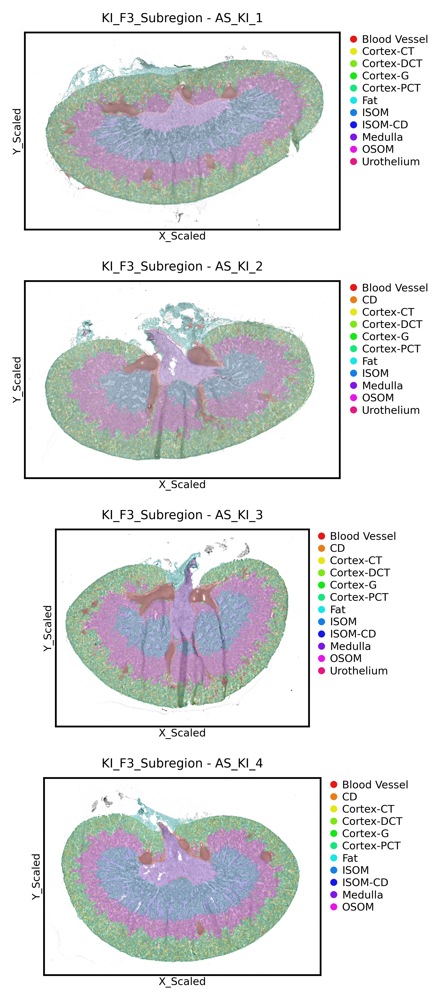

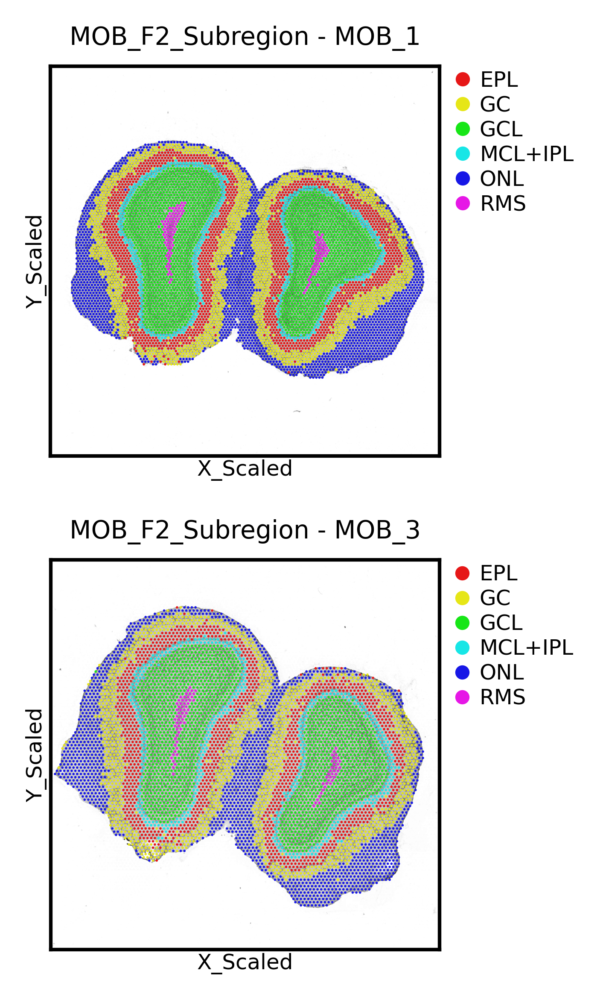

In [8]:
HE_dir = "/project/nchevrier/projects/clevenger1/Projects/ArraySeq/Repurposing_data/GEO_data/images/to_share"


plot_celltype_on_HE(
    adata = combined,
    cell_filter = combined.obs["SampleID"].str.contains("KI", case=False, na=False),
    celltype_col = "Subregion",
    # output_path = "/project/nchevrier/projects/clevenger1/Projects/ArraySeq/Repurposing_data/GEO_data/summary",
    output_path = "",
    image_dir = HE_dir,
    point_size=0.08,
    title="KI_F3_Subregion",
    legend_title=None,
    fixed_palette=None,
    sample_col="SampleID",
    x_col="X_Scaled",
    y_col="Y_Scaled",
)


plot_celltype_on_HE(
    adata = combined,
    cell_filter = combined.obs["SampleID"].str.contains("MOB", case=False, na=False),
    celltype_col = "Subregion",
    # output_path = "/project/nchevrier/projects/clevenger1/Projects/ArraySeq/Repurposing_data/GEO_data/summary",
    output_path = "",
    image_dir = HE_dir,
    point_size=0.45,
    title="MOB_F2_Subregion",
    legend_title=None,
    fixed_palette=None,
    sample_col="SampleID",
    x_col="X_Scaled",
    y_col="Y_Scaled",
)

# Export Metadata

In [9]:
combined.obs.to_csv("/project/nchevrier/projects/clevenger1/Projects/ArraySeq/Repurposing_data/GEO_data/metadata/MOB_KI_metadata.csv", sep=",")